## IMPORTS

In [79]:
#imports basicos
import numpy as np 
import pandas as pd 

#imports auxiliares de ml
from sklearn.ensemble import RandomForestRegressor, GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error

#imports de machine learning     
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, FunctionTransformer
from category_encoders import TargetEncoder, CatBoostEncoder
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from xgboost import XGBRegressor
from sklearn.model_selection import (
    train_test_split, 
    cross_val_score, 
    GridSearchCV,
    KFold,
    RandomizedSearchCV
)

#visualização de dados
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

#warnings
import warnings
warnings.filterwarnings("ignore")

## IMPORTANDO OS DATASETS

In [80]:
# Carrega os datasets
order_items    = pd.read_csv(r'olist_order_items_dataset.csv')
orders         = pd.read_csv(r'olist_orders_dataset.csv')
order_payments = pd.read_csv(r'olist_order_payments_dataset.csv')
products       = pd.read_csv(r'olist_products_dataset.csv')
customers      = pd.read_csv(r'olist_customers_dataset.csv')
sellers        = pd.read_csv(r'olist_sellers_dataset.csv')


# Vammos enriquecer os pedidos
order_data = order_items.merge(orders, on='order_id') \
                    .merge(order_payments, on=['order_id']) \
                    .merge(products, on='product_id') \
                    .merge(customers, on='customer_id') \
                    .merge(sellers, on='seller_id') 


# Dataset final
order_data.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,...,product_length_cm,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,...,28.0,9.0,14.0,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,27277,volta redonda,SP
1,130898c0987d1801452a8ed92a670612,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-07-05 02:44:11,55.9,17.96,e6eecc5a77de221464d1c4eaff0a9b64,delivered,2017-06-28 11:52:20,...,28.0,9.0,14.0,0fb8e3eab2d3e79d92bb3fffbb97f188,75800,jatai,GO,27277,volta redonda,SP
2,532ed5e14e24ae1f0d735b91524b98b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2018-05-23 10:56:25,64.9,18.33,4ef55bf80f711b372afebcb7c715344a,delivered,2018-05-18 10:25:53,...,28.0,9.0,14.0,3419052c8c6b45daf79c1e426f9e9bcb,30720,belo horizonte,MG,27277,volta redonda,SP
3,6f8c31653edb8c83e1a739408b5ff750,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-07 18:55:08,58.9,16.17,30407a72ad8b3f4df4d15369126b20c9,delivered,2017-08-01 18:38:42,...,28.0,9.0,14.0,e7c828d22c0682c1565252deefbe334d,83070,sao jose dos pinhais,PR,27277,volta redonda,SP
4,7d19f4ef4d04461989632411b7e588b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-16 22:05:11,58.9,13.29,91a792fef70ecd8cc69d3c7feb3d12da,delivered,2017-08-10 21:48:40,...,28.0,9.0,14.0,0bb98ba72dcc08e95f9d8cc434e9a2cc,36400,conselheiro lafaiete,MG,27277,volta redonda,SP


## ANÁLISE INICIAL

In [81]:
order_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117601 entries, 0 to 117600
Data columns (total 33 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       117601 non-null  object 
 1   order_item_id                  117601 non-null  int64  
 2   product_id                     117601 non-null  object 
 3   seller_id                      117601 non-null  object 
 4   shipping_limit_date            117601 non-null  object 
 5   price                          117601 non-null  float64
 6   freight_value                  117601 non-null  float64
 7   customer_id                    117601 non-null  object 
 8   order_status                   117601 non-null  object 
 9   order_purchase_timestamp       117601 non-null  object 
 10  order_approved_at              117586 non-null  object 
 11  order_delivered_carrier_date   116356 non-null  object 
 12  order_delivered_customer_date 

In [82]:
#vamos ver a descrição das colunas, com isso podemos tirar já alguns insights:
order_data.describe()

,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_zip_code_prefix,seller_zip_code_prefix
count,117601.000000,117601.000000,117601.000000,117601.000000,117601.000000,117601.000000,115903.000000,115903.000000,115903.000000,117581.000000,117581.000000,117581.000000,117581.000000,117601.000000,117601.000000
mean,1.195900,120.824783,20.045990,1.093528,2.939482,172.686752,48.767590,786.950855,2.207881,2114.309497,30.257235,16.630306,23.068574,35051.793097,24441.423049
std,0.697706,184.479323,15.861315,0.726692,2.774223,267.592290,10.035011,653.036231,1.719531,3788.798201,16.190920,13.458952,11.748468,29820.588877,27572.632286
min,1.000000,0.850000,0.000000,1.000000,0.000000,0.000000,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000,1003.000000,1001.000000
25%,1.000000,39.900000,13.080000,1.000000,1.000000,60.870000,42.000000,347.000000,1.000000,300.000000,18.000000,8.000000,15.000000,11310.000000,6429.000000
50%,1.000000,74.900000,16.290000,1.000000,2.000000,108.210000,52.000000,601.000000,1.000000,700.000000,25.000000,13.000000,20.000000,24315.000000,13660.000000
75%,1.000000,134.900000,21.190000,1.000000,4.000000,189.260000,57.000000,985.000000,3.000000,1800.000000,38.000000,20.000000,30.000000,58600.000000,28035.000000
max,21.000000,6735.000000,409.680000,29.000000,24.000000,13664.080000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,99990.000000,99730.000000


In [83]:
#colunas que importam na precificação
order_data = order_data[['product_category_name', 
            'product_name_lenght',
            'product_description_lenght', 
            'product_photos_qty', 
            'product_weight_g',
            'product_length_cm', 
            'product_height_cm', 
            'product_width_cm',
            "price"]]

#excluir missing
order_data = order_data.dropna()

#shape final
order_data.shape


(115902, 9)

In [84]:
order_data.head()

,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,price
0,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,58.9
1,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,55.9
2,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,64.9
3,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,58.9
4,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,58.9


## VERIFICAÇÃO DE OUTLIERS

In [85]:
#vamos fazer uma verificação dos outliers nos preços
px.box(order_data, y="price")

In [86]:
order_data.price.describe()

count    115902.000000
mean        120.931690
std         184.184747
min           0.850000
25%          39.900000
50%          74.900000
75%         134.900000
max        6735.000000
Name: price, dtype: float64

In [87]:
#vamos verificar o peso dos itens comprados
px.box(order_data, y="product_weight_g")

In [88]:
#será que há relação entre peso x preço?
px.scatter(order_data, x="product_weight_g", y="price")

In [89]:
#observando as correlações
order_data.corr()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,price
product_name_lenght,1.000000,0.090334,0.145664,0.020883,0.058293,-0.030299,0.061956,0.017896
product_description_lenght,0.090334,1.000000,0.117079,0.063602,0.008145,0.073578,-0.067682,0.201833
product_photos_qty,0.145664,0.117079,1.000000,0.021529,0.045279,-0.033565,0.007500,0.052678
product_weight_g,0.020883,0.063602,0.021529,1.000000,0.462667,0.581415,0.506047,0.340415
product_length_cm,0.058293,0.008145,0.045279,0.462667,1.000000,0.190818,0.533448,0.145788
product_height_cm,-0.030299,0.073578,-0.033565,0.581415,0.190818,1.000000,0.278003,0.224392
product_width_cm,0.061956,-0.067682,0.007500,0.506047,0.533448,0.278003,1.000000,0.172386
price,0.017896,0.201833,0.052678,0.340415,0.145788,0.224392,0.172386,1.000000


In [90]:
#vamos fazer uma análise de 3 variáveis
px.scatter_3d(order_data,x="product_weight_g", y="price", z="product_description_lenght", color="product_category_name")

<Axes: >

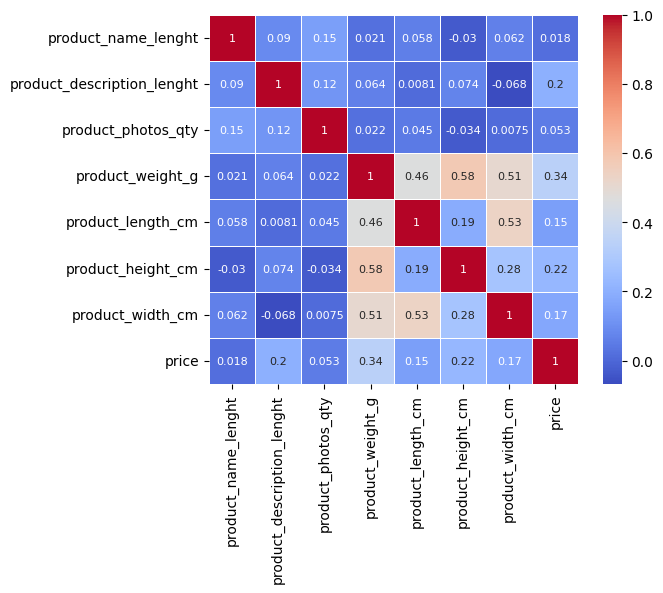

In [91]:
#vamos voltar as correlações, e ver melhor no heatmap
# Create the heatmap using Seaborn
sns.heatmap(order_data.corr(),
            cmap="coolwarm", 
            annot=True, 
            cbar=True, 
            linewidths=0.5, 
            linecolor='white', square=True,
            annot_kws={"size": 8})

## MODELO DE PRECIFICAÇÃO

In [92]:
#tipos de colunas
numerical_features= ['product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm']

categorical_features = ['product_category_name']

In [93]:
features = [
    'product_name_lenght',
    'product_description_lenght', 
    'product_photos_qty', 
    'product_weight_g',
    'product_length_cm', 
    'product_height_cm', 
    'product_width_cm', 
    'product_category_name'
]

target = 'price'

In [94]:
X = order_data[features]
y = order_data[target]

In [95]:
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.2, 
                                                    random_state=42)

1 tentativa

In [96]:
numerical_transformer = Pipeline(steps=[("scaler", StandardScaler())])
categorical_transformer = Pipeline(steps=[("encoder", TargetEncoder())])

preprocessor = ColumnTransformer(transformers=[
    ('num', numerical_transformer, numerical_features),
    ("cat", categorical_transformer, categorical_features)
])

xgb = XGBRegressor()

pipe = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model',xgb)
])

pipe.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['product_name_lenght',
                                                   'product_description_lenght',
                                                   'product_photos_qty',
                                                   'product_weight_g',
                                                   'product_length_cm',
                                                   'product_height_cm',
                                                   'product_width_cm']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   TargetEncoder())]),
                                                  ['product_category_name'])]...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...))])

In [97]:
y_pred = pipe.predict(X_test)

In [98]:
#Fazendo predições nos dados de teste
y_pred = pipe.predict(X_test)

#Avaliando a performance do modelo
print(f"MAE: {mean_absolute_error(y_test, y_pred)}")
print(f"MSE: {mean_squared_error(y_test, y_pred)}")
print(f"RMSE: {mean_squared_error(y_test, y_pred)**0.5}")

MAE: 44.60342980874333
MSE: 12164.47863661825
RMSE: 110.29269530036089


In [99]:
y_test.mean()

120.68311505111946

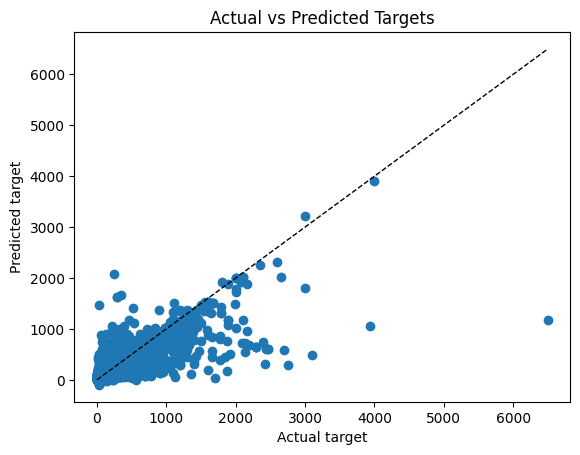

In [100]:
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='black', linewidth=1)
plt.xlabel('Actual target')
plt.ylabel('Predicted target')
plt.title('Actual vs Predicted Targets')
plt.show()

In [101]:
#o cross validation nos dá maior segurança de que não vamos overfitar o modelo
scores = cross_val_score(pipe, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
scores

array([-12292.5511025 , -16069.98892868, -14072.16008014, -11992.37758886,
       -13545.24790995])

como houve pouca variação aqui, então aparentemente não teve nada de errado.

2 tentativa

In [102]:
param_grid = {
    'model__learning_rate': np.linspace(start=0.001, stop=0.3, num=10),
    'model__max_depth': [3, 5, 7, 10, 12, 15],
    'model__n_estimators': [100, 200, 300, 500, 1000],
    'model__max_leaf_nodes': [5, 10, 25, 50, 60, 70, 90, 100, 150, 300]
}

random_search = RandomizedSearchCV(estimator=pipe, 
                                   param_distributions=param_grid, cv=5, n_iter=3)
random_search.fit(X_train, y_train)

print("Melhores hiperparâmetros: ", random_search.best_params_)

Melhores hiperparâmetros:  {'model__n_estimators': 100, 'model__max_leaf_nodes': 50, 'model__max_depth': 10, 'model__learning_rate': 0.23355555555555557}


3 tentativa

Pode-se tentar também o feature engineering, criando uma variável de volume, além disso um tratamento de outlier

In [103]:
#fórmula do volume:
X_train["volume"] = X_train["product_length_cm"]* X_train["product_height_cm"]* X_train["product_width_cm"]
X_test["volume"] = X_test["product_length_cm"]* X_test["product_height_cm"]* X_test["product_width_cm"]
numerical_features.append("volume")

Nesse caso, vamos tratar os outlers via z-score, removendo tudo acima de 3 desvios padrão

In [104]:
train = pd.concat([X_train, y_train], axis=1)

z_scores = np.abs((train['price']-train['price'].mean())/train['price'].std())

outlier_threshold = 3

train_wo_outliers = train[z_scores <= outlier_threshold]
train.shape, train_wo_outliers.shape

((92721, 10), (91066, 10))

In [105]:
X_train.columns

Index(['product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'product_category_name',
       'volume'],
      dtype='object')

In [106]:
X_train_wo_outliers = train_wo_outliers[['product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'product_category_name',
       'volume']]
y_train_wo_outliers = train_wo_outliers['price']

In [107]:
numerical_transformer = Pipeline(steps=[("scaler", StandardScaler())])
categorical_transformer = Pipeline(steps=[("encoder", TargetEncoder())])

preprocessor = ColumnTransformer(transformers=[
    ('num', numerical_transformer, numerical_features),
    ("cat", categorical_transformer, categorical_features)
])

xgb = XGBRegressor()

pipe = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model',xgb)
])

pipe.fit(X_train_wo_outliers, y_train_wo_outliers)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['product_name_lenght',
                                                   'product_description_lenght',
                                                   'product_photos_qty',
                                                   'product_weight_g',
                                                   'product_length_cm',
                                                   'product_height_cm',
                                                   'product_width_cm',
                                                   'volume']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   TargetEncoder())]),
                                                  ['product_category...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...))])

In [108]:
y_pred = pipe.predict(X_test)

In [109]:
print(f"MAE: {mean_absolute_error(y_test, y_pred)}")
print(f"MSE: {mean_squared_error(y_test, y_pred)}")
print(f"RMSE: {mean_squared_error(y_test, y_pred)**0.5}")

MAE: 44.76857994422834
MSE: 21461.23823599456
RMSE: 146.4965468398302


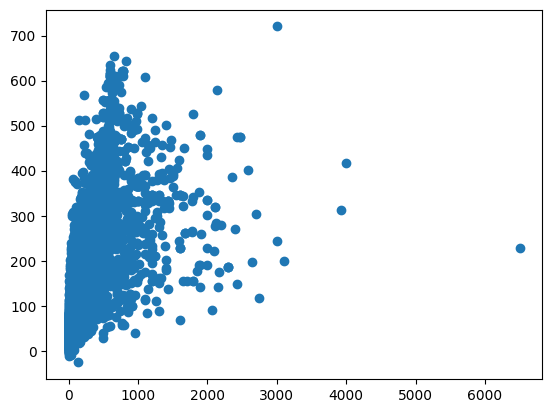

In [110]:
plt.scatter(y_test, y_pred)

removendo os outliers podemos ver que a performance foi pior.

4 tentativa

Vamos manter os outliers, remover colunas redundantes com volume e aplicar os hiperparâmetros, além de aplicar transformações nas features (arcsin, poly, etc)

In [111]:
X_train.drop(['product_length_cm', 'product_height_cm', 'product_width_cm'], axis=1, inplace=True)

In [112]:
X_train.columns

Index(['product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_category_name',
       'volume'],
      dtype='object')

In [113]:
#tipos de colunas
numerical_features= ['product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'volume']
       
categorical_features = ['product_category_name']

In [114]:
numerical_transformer = Pipeline(steps=[("scaler", StandardScaler())])
categorical_transformer = Pipeline(steps=[("encoder", TargetEncoder())])

preprocessor = ColumnTransformer(transformers=[
    ('num', numerical_transformer, numerical_features),
    ("cat", categorical_transformer, categorical_features)
])

xgb = XGBRegressor(n_estimators=1000, max_leaf_nodes=150, max_depth=15, learning_rate= 0.167111111111)

pipe = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model',xgb)
])

pipe.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['product_name_lenght',
                                                   'product_description_lenght',
                                                   'product_photos_qty',
                                                   'product_weight_g',
                                                   'volume']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   TargetEncoder())]),
                                                  ['product_category_name'])])),
                ('model',
                 XGBRegressor(base_score=None, booster=N...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None,
                              learning_rate=0.167111111111, max_bin=None,
                              max_cat_threshold=None, max_cat_to_onehot=None,
                              max_delta_step=None, max_depth=15,
                              max_leaf_nodes=150, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=1000, n_jobs=None,
                              num_parallel_tree=None, ...))])

In [115]:
y_pred = pipe.predict(X_test)

In [116]:
#Fazendo predições nos dados de teste
y_pred = pipe.predict(X_test)

#Avaliando a performance do modelo
print(f"MAE: {mean_absolute_error(y_test, y_pred)}")
print(f"MSE: {mean_squared_error(y_test, y_pred)}")
print(f"RMSE: {mean_squared_error(y_test, y_pred)**0.5}")

MAE: 19.787097455657523
MSE: 8918.349087593995
RMSE: 94.43701121696935


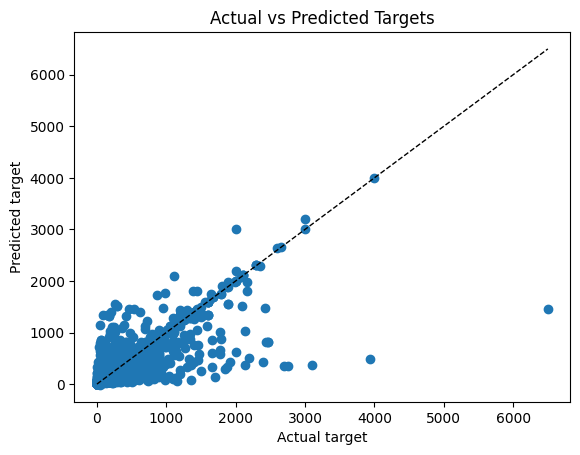

In [117]:
plt.scatter(y_test, y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='black', linewidth=1)
plt.xlabel('Actual target')
plt.ylabel('Predicted target')
plt.title('Actual vs Predicted Targets')
plt.show()

Podemos ver aqui que o modelo melhorou bastante

Vamos verificar agora com as transformações

In [118]:
# Define transformations
transformations = {
    'original': FunctionTransformer(func=lambda x: x, inverse_func=lambda x: x),
    'squared': FunctionTransformer(func=np.square, inverse_func=np.sqrt),
    'sqrt': FunctionTransformer(func=np.sqrt, inverse_func=np.square),
    'log': FunctionTransformer(func=np.log1p, inverse_func=np.expm1),
    'polynomial': PolynomialFeatures(degree=2),
    'arcsen' : FunctionTransformer(func=np.arcsin, inverse_func=np.sin)
}

In [121]:
# Existing pipeline components
categorical_transformer = Pipeline(steps=[("encoder", TargetEncoder())])

xgb = XGBRegressor(n_estimators=1000, max_leaf_nodes=150, max_depth=15, learning_rate=0.167111111111)

# Cross-validation setup
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate each transformation
best_score = -np.inf
best_transformation = None

for name, transformer in transformations.items():
    # Modify numerical transformer
    numerical_transformer = Pipeline(steps=[
        ('transformer', transformer),
        ('scaler', StandardScaler())
    ])
    
    # Define preprocessor
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numerical_transformer, numerical_features),
            ('cat', categorical_transformer, categorical_features)
        ]
    )
    
    # Define pipeline
    pipe = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('model', xgb)
    ])
    
    # Evaluate using cross-validation
    score = cross_val_score(pipe, X_train, y_train, cv=kf, scoring='neg_root_mean_squared_error').mean()
    
    # Compare and store best
    if score > best_score:
        best_score = score
        best_transformation = name
    
    print(f"{name}: CV score = {score}")

print(f"Best transformation is {best_transformation} with CV score = {best_score}")

original: CV score = -102.14054964141971
squared: CV score = -102.14054964141971
sqrt: CV score = -102.14054964141971
log: CV score = -102.14054964141971
polynomial: CV score = -101.88678364557026
arcsen: CV score = -171.59118313650686
Best transformation is polynomial with CV score = -101.88678364557026
